In [ ]:
import pandas as pd
import numpy as np

In [ ]:
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors
import seaborn as sns

# DATA CLEANING AND PREPARATION OF DATASET - COVARIATES


## WIND SPEED
### CLEANING AND AGGREGATION


In [ ]:
from google.colab import files
up = files.upload()
import io
df_v  = pd.read_csv(io.BytesIO(up['Vento - Foglio1.csv']))

In [ ]:
df_v = df_v[l]

In [ ]:
for i, col1 in enumerate(df_v.columns):        # check presence of identical columns
    for col2 in df_v.columns[i+1:]:

        if (df_v[col1] == df_v[col2]).all():
            print(f"{col1} and {col2} are equal in DataFrame")
        else:
          continue

In [ ]:
for col in df_v.columns[1:]:                  # check if column has values that are not float
    if not isinstance(df_v[col], pd.Series):
        continue
    if not (df_v[col].apply(lambda x: isinstance(x, float) or np.isnan(x))).all():
        print(f"Column '{col}' contains non-float values.")

If the covariate's sequence has too many missing value in the period in which I am interest in for the MES estimation I have to delete all of its records.

In [ ]:
a = df_v.loc[8460:11476,:]   #period chosen for the MES (282:381)

In [ ]:
x = find_consecutive_minus_999(a)

In [ ]:
{key: [element for element in value if element > 6] for key, value in x.items()}

In [ ]:
del df_v['Corsico v.le Italia']
del df_v['Gambara v.Parma']
del df_v['Madesimo Spluga']
del df_v['Rho Scalo Fiorenza']
del df_v['Saronno v.Santuario']
del df_v['Vertemate con Minoprio serre']   #stations with too may NaN in the chosen interval

In [ ]:
modify_dataframe(df_v)

In [ ]:
df_v = df_v.replace(-999, np.nan)

In [ ]:
monthly_df_v = create_monthly_df(df_v)

In [ ]:
df_v = df_v / 10

In [ ]:
monthly_df_v = monthly_df_v.reset_index()

In [ ]:
monthly_df_v = monthly_df_v.loc[282:381,:]

In [ ]:
from google.colab import files
monthly_df_v.to_csv('vento_monthly_aggregate_282_381_72.csv', index=None, header=True)
files.download('vento_monthly_aggregate_282_381_72.csv')

### VISUAL ANALYSIS

**Trend over time of mointhly wind speed**

In [ ]:
# Generate a unique scatterplot with 160 different colors for each column
fig, ax = plt.subplots(figsize=(100, 100))
colors = list(mcolors.TABLEAU_COLORS.values())  # Get a list of distinct colors

for i, col in enumerate(c.columns):
    ax.scatter(c.index, c[col], color=colors[i % len(colors)], label=col)

ax.legend(ncol=20, loc='lower center', bbox_to_anchor=(0.5, -0.1))  # Add a legend showing the column names

plt.xlabel('Months')
plt.ylabel('Values')
plt.title('Scatterplot for each column')
plt.show()

**Relation between monthly average Rainfall and monthly average Wind Speed**

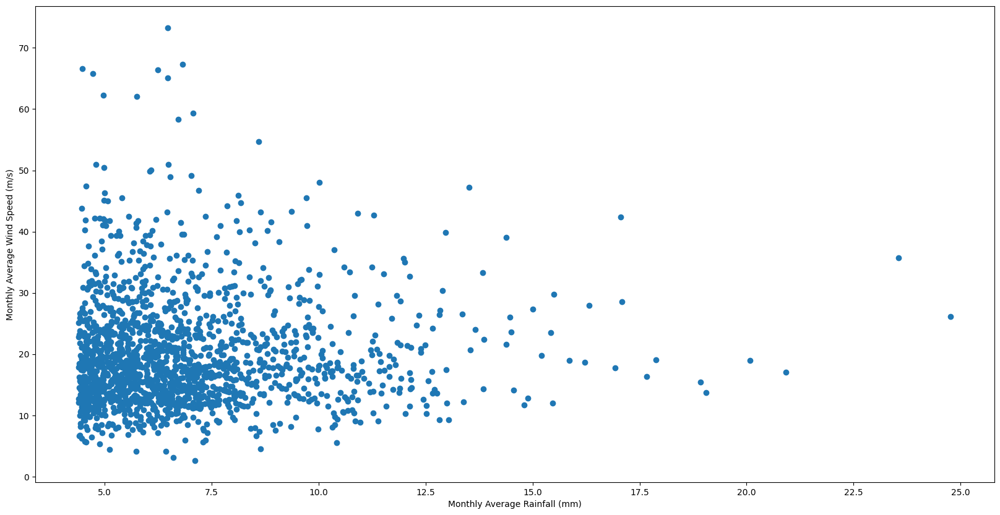

In [ ]:
df1 = sel_monthly_df[monthly_df_v.columns]
all_values_df1 = df1.values.flatten()
all_values_df2 = monthly_df_v.values.flatten()

# Filter data based on x-axis condition (x > 4.39)
filtered_values_df1 = all_values_df1[all_values_df1 > 4.39]
filtered_values_df2 = all_values_df2[all_values_df1 > 4.39]  # Use the same condition for filtering

# Create a scatterplot with filtered values
plt.figure(figsize=(20, 10))
plt.scatter(filtered_values_df1, filtered_values_df2)
plt.xlabel('Monthly Average Rainfall (mm)')
plt.ylabel('Monthly Average Wind Speed (m/s)')
#plt.title('temperatura')
plt.show()

## SOLAR RADIATION

### CLEANING AND AGGREGATION

In [ ]:
from google.colab import files
up = files.upload()
import io
df_r  = pd.read_csv(io.BytesIO(up['Radiazione Globale - Foglio1 (1).csv']))

In [ ]:
df_r = df_r[l]

In [ ]:
for i, col1 in enumerate(df_r.columns):
    for col2 in df_r.columns[i+1:]:
                                            # check if col1 and col2 are equal
        if (df_r[col1] == df_r[col2]).all():
            print(f"{col1} and {col2} are equal in DataFrame")
        else:
          continue

In [ ]:
for col in df_r.columns[1:]:
    if not isinstance(df_r[col], pd.Series):  # check if column is a pandas series
        continue
    if not (df_r[col].apply(lambda x: isinstance(x, float) or np.isnan(x))).all():
        print(f"Column '{col}' contains non-float values.")

In [ ]:
a = df_r.loc[8460:11476,:]   #period chosen for the MES (282:381)

In [ ]:
x = find_consecutive_minus_999(a)

In [ ]:
{key: [element for element in value if element > 6] for key, value in x.items()}

In [ ]:
del df_r['Bertonico v.Moro']
del df_r['Carona Carisole']
del df_r['Lanzada Passo Marinelli']
del df_r['Ponti sul Mincio v.San Martino']
del df_r['Saronno v.Santuario']   #stations with too may NaN in the chosen interval

In [ ]:
modify_dataframe(df_r)

In [ ]:
df_r = df_r.replace(-999, np.nan)

In [ ]:
monthly_df_r = create_monthly_df(df_r)

In [ ]:
monthly_df_r = monthly_df_r / 10

In [ ]:
monthly_df_r = monthly_df_r.reset_index()

In [ ]:
monthly_df_r = monthly_df_r.loc[282:381,:]

In [ ]:
from google.colab import files
monthly_df_r.to_csv('radiazione_monthly_aggregate_282_381_51.csv', index=None, header=True)
files.download('radiazione_monthly_aggregate_282_381_51.csv')

## VISUAL ANALYSIS

**Trend of monthly Radiation over years**

In [ ]:
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors

# Assuming you have a dataframe named 'df' with 160 columns

# Generate a unique scatterplot with 160 different colors for each column
fig, ax = plt.subplots(figsize=(100, 100))
colors = list(mcolors.TABLEAU_COLORS.values())  # Get a list of distinct colors

for i, col in enumerate(c.columns):
    ax.scatter(monthly_df_r.index, monthly_df_r[col], color=colors[i % len(colors)], label=col)

ax.legend(ncol=20, loc='lower center', bbox_to_anchor=(0.5, -0.1))  # Add a legend showing the column names

plt.xlabel('Months')
plt.ylabel('Values')
plt.title('Scatterplot for each column')
plt.show()

**Relation between Monthly Rainfall and Monthly Radiation**

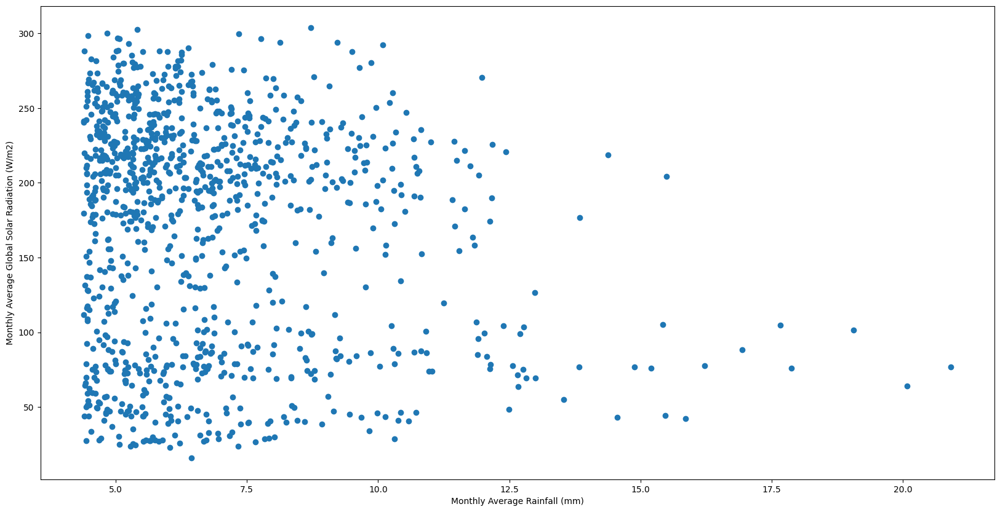

In [ ]:
df1 = sel_monthly_df[monthly_df_r.columns]
all_values_df1 = df1.values.flatten()
all_values_df2 = monthly_df_r.values.flatten()

# Filter data based on x-axis condition (x > 4.39)
filtered_values_df1 = all_values_df1[all_values_df1 > 4.39]
filtered_values_df2 = all_values_df2[all_values_df1 > 4.39]  # Use the same condition for filtering

# Create a scatterplot with filtered values
plt.figure(figsize=(20, 10))
plt.scatter(filtered_values_df1, filtered_values_df2)
plt.xlabel('Monthly Average Rainfall (mm)')
plt.ylabel('Monthly Average Global Solar Radiation (W/m2)')
#plt.title('temperatura')
plt.show()

##TEMPERATURE##

### DATA CLEANING AND AGGREGATION

In [ ]:
from google.colab import files
up = files.upload()
import io
df_t  = pd.read_csv(io.BytesIO(up['Temperatura - Foglio1.csv']))

Saving Radiazione Globale - Foglio1 (1).csv to Radiazione Globale - Foglio1 (1).csv


In [ ]:
df_t = df_t[l]

In [ ]:
for i, col1 in enumerate(df_t.columns):
    for col2 in df_t.columns[i+1:]:
                                            # check if col1 and col2 are equal
        if (df_t[col1] == df_t[col2]).all():
            print(f"{col1} and {col2} are equal in DataFrame")
        else:
          continue

In [ ]:
for col in df_t.columns[1:]:
    if not isinstance(df_t[col], pd.Series):  # check if column is a pandas series
        continue
    if not (df_t[col].apply(lambda x: isinstance(x, float) or np.isnan(x))).all():
        print(f"Column '{col}' contains non-float values.")

In [ ]:
a = df_t.loc[8460:11476,:]   #period chosen for the MES (282:381)

In [ ]:
x = find_consecutive_minus_999(a)

In [ ]:
{key: [element for element in value if element > 6] for key, value in x.items()}

In [ ]:
del df_t['Brescia v.Ziziola']
del df_t['Gambara v.Parma']
del df_t['Gordona']
del df_t['Livigno Passo Foscagno']
del df_t['Spinadesco v.Battisti']
del df_t['Bergamo v.Stezzano']  #stations with too may NaN in the chosen interval

In [ ]:
modify_dataframe(df_t)

In [ ]:
df_t = df_t.replace(-999, np.nan)

In [ ]:
monthly_df_t = create_monthly_df(df_t)

In [ ]:
monthly_df_t = monthly_df_t / 10

In [ ]:
monthly_df_t = monthly_df_t.reset_index()

In [ ]:
monthly_df_t = monthly_df_t.loc[282:381,:]

In [ ]:
from google.colab import files
monthly_df_t.to_csv('temperatura_monthly_aggregate_282_381_132.csv', index=None, header=True)
files.download('temperatura_monthly_aggregate_282_381_132.csv')

### VISUAL ANALYSIS

**Trend of monthly Temperature over years**

In [ ]:
# Generate a unique scatterplot with 160 different colors for each column
fig, ax = plt.subplots(figsize=(100, 100))
colors = list(mcolors.TABLEAU_COLORS.values())  # Get a list of distinct colors

for i, col in enumerate(monthly_df_t.columns):
    ax.scatter(monthly_df_t.index, monthly_df_t[col], color=colors[i % len(colors)], label=col)

ax.legend(ncol=20, loc='lower center', bbox_to_anchor=(0.5, -0.1))  # Add a legend showing the column names

plt.xlabel('Months')
plt.ylabel('Values')
plt.title('Scatterplot for each column')
plt.show()

**Relation between Monthly Rainfall and Monthly Temperature**

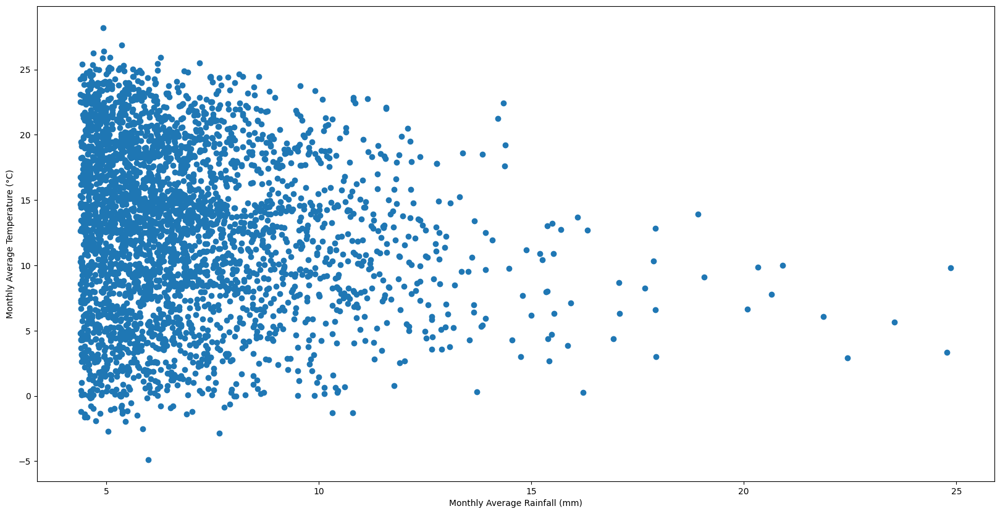

In [ ]:
df1 = monthly_df[monthly_df_t.columns]
all_values_df1 = df1.values.flatten()
all_values_df2 = monthly_df_t.values.flatten()

# Filter data based on x-axis condition (x > 4.39)
filtered_values_df1 = all_values_df1[all_values_df1 > 4.39]
filtered_values_df2 = all_values_df2[all_values_df1 > 4.39]  # Use the same condition for filtering

# Create a scatterplot with filtered values
plt.figure(figsize=(20, 10))
plt.scatter(filtered_values_df1, filtered_values_df2)
plt.xlabel('Monthly Average Rainfall (mm)')
plt.ylabel('Monthly Average Temperature (°C)')
#plt.title('temperatura')
plt.show()

## RELATIVE HUMIDITY

### DATA CLEANING AND AGGREGATION

In [ ]:
from google.colab import files
up = files.upload()
import io
df_u  = pd.read_csv(io.BytesIO(up['Umidità - Foglio1.csv']))

Saving Radiazione Globale - Foglio1 (1).csv to Radiazione Globale - Foglio1 (1).csv


In [ ]:
df_u = df_u[l]

In [ ]:
for i, col1 in enumerate(df_u.columns):
    for col2 in df_u.columns[i+1:]:
                                            # check if col1 and col2 are equal
        if (df_u[col1] == df_u[col2]).all():
            print(f"{col1} and {col2} are equal in DataFrame")
        else:
          continue

In [ ]:
for col in df_u.columns[1:]:
    if not isinstance(df_u[col], pd.Series):  # check if column is a pandas series
        continue
    if not (df_u[col].apply(lambda x: isinstance(x, float) or np.isnan(x))).all():
        print(f"Column '{col}' contains non-float values.")

In [ ]:
a = df_u.loc[8460:11476,:]   #period chosen for the MES (282:381)

In [ ]:
x = find_consecutive_minus_999(a)

In [ ]:
{key: [element for element in value if element > 6] for key, value in x.items()}

In [ ]:
del df_u['Bigarello']
del df_u['Caiolo']
del df_u['Fortunago']
del df_u['Gonzaga Palidano']
del df_u['Mantova Tridolino']
del df_u['Ponti sul Mincio v.San Martino']
del df_u['Valmadrera v.Pozzi']  #stations with too may NaN in the chosen interval

In [ ]:
modify_dataframe(df_u)

In [ ]:
df_u = df_u.replace(-999, np.nan)

In [ ]:
monthly_df_u = create_monthly_df(df_u)

In [ ]:
monthly_df_u = monthly_df_u / 10

In [ ]:
monthly_df_u = monthly_df_u.reset_index()

In [ ]:
monthly_df_u = monthly_df_u.loc[282:381,:]

In [ ]:
from google.colab import files
monthly_df_u.to_csv('umidità_monthly_aggregate_282_381_91.csv', index=None, header=True)
files.download('umidità_monthly_aggregate_282_381_91.csv')

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

### VISUAL ANALYSIS

**Trend of Monthly Humidity over years**

In [ ]:
# Assuming you have a dataframe named 'df' with 160 columns

# Generate a unique scatterplot with 160 different colors for each column
fig, ax = plt.subplots(figsize=(100, 100))
colors = list(mcolors.TABLEAU_COLORS.values())  # Get a list of distinct colors

for i, col in enumerate(monthly_df_u.columns):
    ax.scatter(monthly_df_u.index, monthly_df_u[col], color=colors[i % len(colors)], label=col)

ax.legend(ncol=20, loc='lower center', bbox_to_anchor=(0.5, -0.1))  # Add a legend showing the column names

plt.xlabel('Months')
plt.ylabel('Values')
plt.title('Scatterplot for each column')
plt.show()

**Relation between Monthly Rainfall and Monthly Humidity**

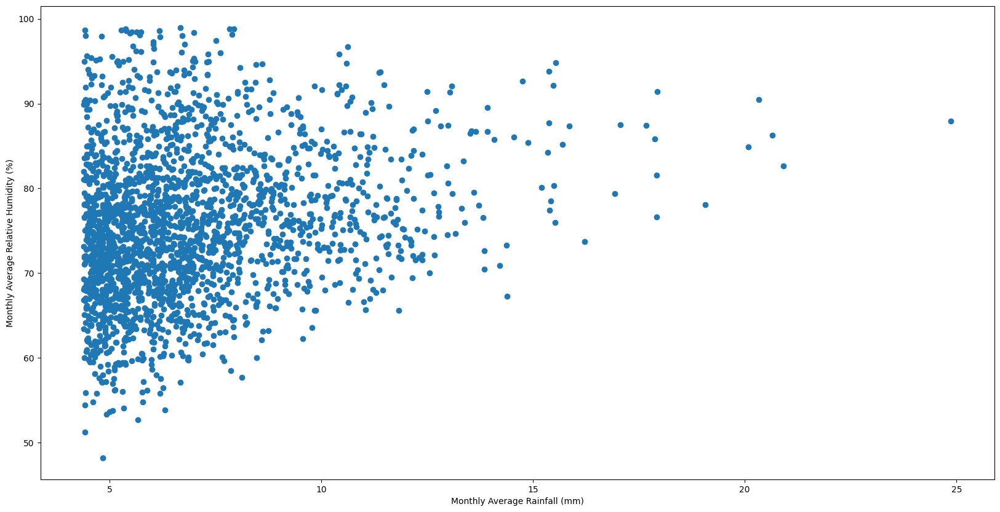

In [ ]:
df1 = sel_monthly_df[monthly_df_u.columns]
all_values_df1 = df1.values.flatten()
all_values_df2 = monthly_df_u.values.flatten()

# Filter data based on x-axis condition (x > 4.39)
filtered_values_df1 = all_values_df1[all_values_df1 > 4.39]
filtered_values_df2 = all_values_df2[all_values_df1 > 4.39]  # Use the same condition for filtering

# Create a scatterplot with filtered values
plt.figure(figsize=(20, 10))
plt.scatter(filtered_values_df1, filtered_values_df2)
plt.xlabel('Monthly Average Rainfall (mm)')
plt.ylabel('Monthly Average Relative Humidity (%)')
#plt.title('temperatura')
plt.show()

## SEASONS

I create the column "Season" that represent the corresponding month of the observation and from it the different dummies AutumnSpring, AutumnWinter, AutumnSummer and Autumn.
In the code the names are autunnoprim, autunnoinv, autunnoest and autunno that are the italian translations.

In [ ]:
pattern = [3, 3, 3, 4, 4, 4, 1, 1, 1, 2, 2, 2]  #3 autumn 4 winter 1 spring 2 summer

# Calculate the length of the pattern
pattern_length = len(pattern)

# Assign the pattern to the 'Season' column in a repeating manner
start_index = 0

sel_monthly_df['Season'].iloc[start_index:] = [pattern[i % pattern_length] for i in range(start_index, len(df))]

In [ ]:
def Autumn_Spring(stagione):
    if stagione in [2, 4]:
        return 0
    elif stagione in [1, 3]:
        return 1
    else:
        return None  # You can handle other cases if necessary

sel_monthly_df['autunno_prim'] = sel_monthly_df['Season'].apply(Autumn_Spring)

In [ ]:
def Autumn_Winter(stagione):
    if stagione in [1, 2]:
        return 0
    elif stagione in [3, 4]:
        return 1
    else:
        return None  # You can handle other cases if necessary

sel_monthly_df['autunno_inv'] = sel_monthly_df['Season'].apply(Autumn_Winter)

In [ ]:
def Autumn_Summer(stagione):
    if stagione in [1, 4]:
        return 0
    elif stagione in [3, 2]:
        return 1
    else:
        return None  # You can handle other cases if necessary

sel_monthly_df['autunno_est'] = sel_monthly_df['Season'].apply(Autumn_Summer)

In [ ]:
def Autumn(stagione):
    if stagione in [1,4,2] :
        return 0
    elif stagione in [3] :
        return 1
    else:
        return None  # You can handle other cases if necessary

# Use the apply function to create the "Piovosità" column based on the "Stagione" column
sel_monthly_df['autunno'] = sel_monthly_df['Seasons'].apply(Autumn)

In [ ]:
from google.colab import files
sel_monthly_df.to_csv('monthly_aggregate_282_381_160_seasons_dummy_eautunno.csv', index=None, header=True)
files.download('monthly_aggregate_282_381_160_seasons_dummy_eautunno.csv')

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>